# Project: Wrangling and Analyzing Data

## Introduction

The dataset used in this project is the tweet archive of Twitter user @dog_rates, also known as WeRateDogs. 

WeRateDogs is a Twitter account that rates people's dogs with a humorous comment about the dog.  WeRateDogs has over 4 million followers and has received international media coverage.

This archive contains basic tweet data (tweet ID, timestamp, text, etc.) for all 5000+ of their tweets as they stood on August 1, 2017. 

The WeRateDogs Twitter archive contains basic tweet data for all 5000+ of their tweets, but not everything like the favourite counts, number of retweets, etc.

Using the tweet IDs in the WeRateDogs Twitter archive, the Twitter API would be queried for each tweet's JSON data using Python's Tweepy library to get additional information for the analysis.

The project would annswer the following questions:

 1. What is the top source, users tweeted from?
 2. The top 10 most popular dog breed in the tweets
 3. Top rated dog based on retweets
 4. Top rated dog based on favorite count
 5. The winner of the contest, which is top rated based on dog rating and retweet count and favorite count.

In [2]:
# let's import our libraries and packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import sklearn
import requests
import json
import tweepy
import io
import os
import datetime
import time

# Data Gathering


In [3]:
twitter_archive = pd.read_csv("twitter-archive-enhanced.csv")

In [4]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [5]:
twitter_archive

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


In [6]:
twitter_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

Let's use the request library to to download the image prediction file(image_predictions.tsv)


In [7]:
# URL downloaded programmatically
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

# Opening a tsv file and saving the response content
with open('image-predictions.tsv', mode='wb') as file:
    file.write(response.content)
    
# Read TSV file
image_prediction = pd.read_csv('image-predictions.tsv', sep='\t')

In [8]:
image_prediction.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [9]:
image_prediction.shape

(2075, 12)

Let's use the Tweepy library to query additional data via the Twitter API 

We're going to query Twitter API for each tweet using the tweet ID in the Twitter archive and save JSON in a text file as **tweet_json.txt**



In [9]:
import tweepy

consumer_key = "SECRET"
consumer_secret = "SECRET"
access_token = "SECRET"
access_secret = "SECRET"

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True)

Let's extract the IDs from the twitter archive

In [10]:
tweet_IDs = twitter_archive.tweet_id.values
tweet_IDs

array([892420643555336193, 892177421306343426, 891815181378084864, ...,
       666033412701032449, 666029285002620928, 666020888022790149],
      dtype=int64)

In [11]:
len(tweet_IDs)

2356

In [13]:
# Query Twitter's API for the JSON data of each tweet ID in the Twitter archive
index = 0
# dictionary to catch the errors
error_dict = {}
start = time.time()

# Save each tweet's returned JSON as a new line in a .txt file
with open ('tweet_json.txt', 'w') as tweet_bk:
    # This will likely take 20 - 30 minutes to run because of Twitter's rate limit
    for tweet_id in tweet_IDs:
        index += 1
        try:
            # Get the status data for each of the tweet IDs
            tweet = api.get_status(tweet_id, tweet_mode = 'extended')
            print(str(index) + " - " + str(tweet_id))
            # Convert each tweet status to JSON string and save it in the tweet_bk file
            json.dump(tweet._json, tweet_bk)
            # recognize \n as a break of text
            tweet_bk.write("\n")
            
        # Catching errors that might occur while accessing the tweet data or content
        except tweepy.TweepyException as error:
            print(str(index) + " - " + str(tweet_id) + " has an error:")
            # Appending the errors to the dictionary; error_dict
            error_dict[tweet_id] = error
            
end = time.time()
print(end - start)

1 - 892420643555336193
2 - 892177421306343426
3 - 891815181378084864
4 - 891689557279858688
5 - 891327558926688256
6 - 891087950875897856
7 - 890971913173991426
8 - 890729181411237888
9 - 890609185150312448
10 - 890240255349198849
11 - 890006608113172480
12 - 889880896479866881
13 - 889665388333682689
14 - 889638837579907072
15 - 889531135344209921
16 - 889278841981685760
17 - 888917238123831296
18 - 888804989199671297
19 - 888554962724278272
20 - 888202515573088257 has an error:
21 - 888078434458587136
22 - 887705289381826560
23 - 887517139158093824
24 - 887473957103951883
25 - 887343217045368832
26 - 887101392804085760
27 - 886983233522544640
28 - 886736880519319552
29 - 886680336477933568
30 - 886366144734445568
31 - 886267009285017600
32 - 886258384151887873
33 - 886054160059072513
34 - 885984800019947520
35 - 885528943205470208
36 - 885518971528720385
37 - 885311592912609280
38 - 885167619883638784
39 - 884925521741709313
40 - 884876753390489601
41 - 884562892145688576
42 - 884441

325 - 834086379323871233
326 - 833863086058651648
327 - 833826103416520705
328 - 833732339549220864
329 - 833722901757046785
330 - 833479644947025920
331 - 833124694597443584
332 - 832998151111966721
333 - 832769181346996225
334 - 832757312314028032
335 - 832682457690300417
336 - 832645525019123713
337 - 832636094638288896
338 - 832397543355072512
339 - 832369877331693569
340 - 832273440279240704
341 - 832215909146226688
342 - 832215726631055365
343 - 832088576586297345
344 - 832040443403784192
345 - 832032802820481025
346 - 831939777352105988
347 - 831926988323639298
348 - 831911600680497154
349 - 831670449226514432
350 - 831650051525054464
351 - 831552930092285952
352 - 831322785565769729
353 - 831315979191906304
354 - 831309418084069378
355 - 831262627380748289
356 - 830956169170665475
357 - 830583320585068544
358 - 830173239259324417
359 - 830097400375152640
360 - 829878982036299777
361 - 829861396166877184
362 - 829501995190984704
363 - 829449946868879360
364 - 829374341691346946 

651 - 792883833364439040
652 - 792773781206999040
653 - 792394556390137856
654 - 792050063153438720
655 - 791821351946420224
656 - 791784077045166082
657 - 791780927877898241
658 - 791774931465953280
659 - 791672322847637504
660 - 791406955684368384
661 - 791312159183634433
662 - 791026214425268224
663 - 790987426131050500
664 - 790946055508652032
665 - 790723298204217344
666 - 790698755171364864
667 - 790581949425475584
668 - 790337589677002753
669 - 790277117346975746
670 - 790227638568808452
671 - 789986466051088384
672 - 789960241177853952
673 - 789903600034189313
674 - 789628658055020548
675 - 789599242079838210
676 - 789530877013393408
677 - 789314372632018944
678 - 789280767834746880
679 - 789268448748703744
680 - 789137962068021249
681 - 788908386943430656
682 - 788765914992902144
683 - 788552643979468800
684 - 788412144018661376
685 - 788178268662984705
686 - 788150585577050112
687 - 788070120937619456
688 - 788039637453406209
689 - 787810552592695296
690 - 787717603741622272


975 - 750056684286914561
976 - 750041628174217216
977 - 750026558547456000
978 - 750011400160841729
979 - 749996283729883136
980 - 749981277374128128
981 - 749774190421639168
982 - 749417653287129088
983 - 749403093750648834
984 - 749395845976588288
985 - 749317047558017024
986 - 749075273010798592
987 - 749064354620928000
988 - 749036806121881602
989 - 748977405889503236
990 - 748932637671223296
991 - 748705597323898880
992 - 748699167502000129
993 - 748692773788876800
994 - 748575535303884801
995 - 748568946752774144
996 - 748346686624440324
997 - 748337862848962560
998 - 748324050481647620
999 - 748307329658011649
1000 - 748220828303695873
1001 - 747963614829678593
1002 - 747933425676525569
1003 - 747885874273214464
1004 - 747844099428986880
1005 - 747816857231626240
1006 - 747651430853525504
1007 - 747648653817413632
1008 - 747600769478692864
1009 - 747594051852075008
1010 - 747512671126323200
1011 - 747461612269887489
1012 - 747439450712596480
1013 - 747242308580548608
1014 - 7472

1292 - 708119489313951744
1293 - 708109389455101952
1294 - 708026248782585858
1295 - 707995814724026368
1296 - 707983188426153984
1297 - 707969809498152960
1298 - 707776935007539200
1299 - 707741517457260545
1300 - 707738799544082433
1301 - 707693576495472641
1302 - 707629649552134146
1303 - 707610948723478529
1304 - 707420581654872064
1305 - 707411934438625280
1306 - 707387676719185920
1307 - 707377100785885184
1308 - 707315916783140866
1309 - 707297311098011648
1310 - 707059547140169728
1311 - 707038192327901184
1312 - 707021089608753152
1313 - 707014260413456384
1314 - 706904523814649856
1315 - 706901761596989440
1316 - 706681918348251136
1317 - 706644897839910912
1318 - 706593038911545345
1319 - 706538006853918722
1320 - 706516534877929472
1321 - 706346369204748288
1322 - 706310011488698368
1323 - 706291001778950144
1324 - 706265994973601792
1325 - 706169069255446529
1326 - 706166467411222528
1327 - 706153300320784384
1328 - 705975130514706432
1329 - 705970349788291072
1330 - 70589

Rate limit reached. Sleeping for: 242


1504 - 692017291282812928
1505 - 691820333922455552
1506 - 691793053716221953
1507 - 691756958957883396
1508 - 691675652215414786
1509 - 691483041324204033
1510 - 691459709405118465
1511 - 691444869282295808
1512 - 691416866452082688
1513 - 691321916024623104
1514 - 691096613310316544
1515 - 691090071332753408
1516 - 690989312272396288
1517 - 690959652130045952
1518 - 690938899477221376
1519 - 690932576555528194
1520 - 690735892932222976
1521 - 690728923253055490
1522 - 690690673629138944
1523 - 690649993829576704
1524 - 690607260360429569
1525 - 690597161306841088
1526 - 690400367696297985
1527 - 690374419777196032
1528 - 690360449368465409
1529 - 690348396616552449
1530 - 690248561355657216
1531 - 690021994562220032
1532 - 690015576308211712
1533 - 690005060500217858
1534 - 689999384604450816
1535 - 689993469801164801
1536 - 689977555533848577
1537 - 689905486972461056
1538 - 689877686181715968
1539 - 689835978131935233
1540 - 689661964914655233
1541 - 689659372465688576
1542 - 68962

1819 - 676593408224403456
1820 - 676590572941893632
1821 - 676588346097852417
1822 - 676582956622721024
1823 - 676575501977128964
1824 - 676533798876651520
1825 - 676496375194980353
1826 - 676470639084101634
1827 - 676440007570247681
1828 - 676430933382295552
1829 - 676263575653122048
1830 - 676237365392908289
1831 - 676219687039057920
1832 - 676215927814406144
1833 - 676191832485810177
1834 - 676146341966438401
1835 - 676121918416756736
1836 - 676101918813499392
1837 - 676098748976615425
1838 - 676089483918516224
1839 - 675898130735476737
1840 - 675891555769696257
1841 - 675888385639251968
1842 - 675878199931371520
1843 - 675870721063669760
1844 - 675853064436391936
1845 - 675849018447167488
1846 - 675845657354215424
1847 - 675822767435051008
1848 - 675820929667219457
1849 - 675798442703122432
1850 - 675781562965868544
1851 - 675740360753160193
1852 - 675710890956750848
1853 - 675707330206547968
1854 - 675706639471788032
1855 - 675534494439489536
1856 - 675531475945709568
1857 - 67552

2135 - 670069087419133954
2136 - 670061506722140161
2137 - 670055038660800512
2138 - 670046952931721218
2139 - 670040295598354432
2140 - 670037189829525505
2141 - 670003130994700288
2142 - 669993076832759809
2143 - 669972011175813120
2144 - 669970042633789440
2145 - 669942763794931712
2146 - 669926384437997569
2147 - 669923323644657664
2148 - 669753178989142016
2149 - 669749430875258880
2150 - 669684865554620416
2151 - 669683899023405056
2152 - 669682095984410625
2153 - 669680153564442624
2154 - 669661792646373376
2155 - 669625907762618368
2156 - 669603084620980224
2157 - 669597912108789760
2158 - 669583744538451968
2159 - 669573570759163904
2160 - 669571471778410496
2161 - 669567591774625800
2162 - 669564461267722241
2163 - 669393256313184256
2164 - 669375718304980992
2165 - 669371483794317312
2166 - 669367896104181761
2167 - 669363888236994561
2168 - 669359674819481600
2169 - 669354382627049472
2170 - 669353438988365824
2171 - 669351434509529089
2172 - 669328503091937280
2173 - 66932

In [14]:
print(error_dict)


{888202515573088257: NotFound('404 Not Found\n144 - No status found with that ID.'), 873697596434513921: NotFound('404 Not Found\n144 - No status found with that ID.'), 872668790621863937: NotFound('404 Not Found\n144 - No status found with that ID.'), 872261713294495745: NotFound('404 Not Found\n144 - No status found with that ID.'), 869988702071779329: NotFound('404 Not Found\n144 - No status found with that ID.'), 866816280283807744: NotFound('404 Not Found\n144 - No status found with that ID.'), 861769973181624320: NotFound('404 Not Found\n144 - No status found with that ID.'), 856602993587888130: NotFound('404 Not Found\n144 - No status found with that ID.'), 856330835276025856: NotFound('404 Not Found\n144 - No status found with that ID.'), 851953902622658560: NotFound('404 Not Found\n144 - No status found with that ID.'), 851861385021730816: NotFound('404 Not Found\n144 - No status found with that ID.'), 845459076796616705: NotFound('404 Not Found\n144 - No status found with tha

In [10]:

# Empty list to convert to DataFrame
df_list = []

# Open text file for reading
with open ('tweet_json.txt', 'r') as json_file:
    for line in json_file.readlines():
        # Read each JSON string status into a dictionary and reading each line as a dictionary
        each_tweet_line = json.loads(line)
        # Getting the required parameters
        tweet_id = each_tweet_line['id']
        retwt_count = each_tweet_line['retweet_count']
        fav_count = each_tweet_line['favorite_count']
        
        df_list.append({'id': tweet_id,
                       'retweet_count': retwt_count,
                       'favorite_count': fav_count})
        
tweet_json_df = pd.DataFrame(df_list, columns=['id', 'retweet_count', 'favorite_count'])

In [11]:
df_list

[{'id': 892420643555336193, 'retweet_count': 7009, 'favorite_count': 33807},
 {'id': 892177421306343426, 'retweet_count': 5301, 'favorite_count': 29330},
 {'id': 891815181378084864, 'retweet_count': 3481, 'favorite_count': 22052},
 {'id': 891689557279858688, 'retweet_count': 7225, 'favorite_count': 36938},
 {'id': 891327558926688256, 'retweet_count': 7760, 'favorite_count': 35308},
 {'id': 891087950875897856, 'retweet_count': 2602, 'favorite_count': 17812},
 {'id': 890971913173991426, 'retweet_count': 1663, 'favorite_count': 10363},
 {'id': 890729181411237888, 'retweet_count': 15753, 'favorite_count': 56865},
 {'id': 890609185150312448, 'retweet_count': 3620, 'favorite_count': 24525},
 {'id': 890240255349198849, 'retweet_count': 6098, 'favorite_count': 27963},
 {'id': 890006608113172480, 'retweet_count': 6152, 'favorite_count': 27037},
 {'id': 889880896479866881, 'retweet_count': 4166, 'favorite_count': 24569},
 {'id': 889665388333682689, 'retweet_count': 8349, 'favorite_count': 42050}

In [12]:
tweet_json_df

,id,retweet_count,favorite_count
0,892420643555336193,7009,33807
1,892177421306343426,5301,29330
2,891815181378084864,3481,22052
3,891689557279858688,7225,36938
4,891327558926688256,7760,35308
5,891087950875897856,2602,17812
6,890971913173991426,1663,10363
7,890729181411237888,15753,56865
8,890609185150312448,3620,24525
9,890240255349198849,6098,27963


# Data Assessing

In [13]:
df1 = twitter_archive.copy()
df2 = image_prediction.copy()
df3 = tweet_json_df.copy()

In [14]:
df1

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


### twitter_archive columns description:

- tweet_id: the unique identifier for each tweet

- in_reply_to_status_id: if the represented Tweet is a reply, this field will contain the integer representation of the original Tweet’s ID

- in_reply_to_user_id: if the represented Tweet is a reply, this field will contain the integer representation of the original Tweet’s author ID

- timestamp: time when this Tweet was created

- source: utility used to post the Tweet, as an HTML-formatted string. e.g. Twitter for Android, Twitter for iPhone, Twitter Web Client

- text: actual UTF-8 text of the status update

- retweeted_status_id: if the represented Tweet is a retweet, this field will contain the integer representation of the original Tweet’s ID

- retweeted_status_user_id: if the represented Tweet is a retweet, this field will contain the integer representation of the original Tweet’s author ID

- retweeted_status_timestamp: time of retweet

- expanded_urls: tweet URL

- rating_numerator: numerator of the rating of a dog. Note: ratings almost always greater than 10

- rating_denominator: denominator of the rating of a dog. Note: ratings almost always have a denominator of 10

- name: name of the dog

- doggo: one of the 4 dog "stage"

- floofer: one of the 4 dog "stage"

- pupper: one of the 4 dog "stage"

- puppo: one of the 4 dog "stageColumns description

In [15]:
df2

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


### image_prediction columns description:

- tweet_id: the unique identifier for each tweet

- jpg_url: dog's image URL

- img_num: the image number that corresponded to the most confident prediction (numbered 1 to 4 since tweets can have up to four images)

- p1: algorithm's #1 prediction for the image in the tweet

- p1_conf: how confident the algorithm is in its #1 prediction

- p1_dog: whether or not the #1 prediction is a breed of dog

- p2: algorithm's #2 prediction for the image in the tweet

- p2_conf: how confident the algorithm is in its #2 prediction

- p2_dog: whether or not the #2 prediction is a breed of dog

- p3: algorithm's #3 prediction for the image in the tweet

- p3_conf: how confident the algorithm is in its #3 prediction

- p3_dog: whether or not the #3 prediction is a breed of dog

In [16]:
df3

,id,retweet_count,favorite_count
0,892420643555336193,7009,33807
1,892177421306343426,5301,29330
2,891815181378084864,3481,22052
3,891689557279858688,7225,36938
4,891327558926688256,7760,35308
5,891087950875897856,2602,17812
6,890971913173991426,1663,10363
7,890729181411237888,15753,56865
8,890609185150312448,3620,24525
9,890240255349198849,6098,27963


### tweet_json_df columns description

- id: the unique identifier for each tweet

- retweet_count: the number of times the original tweet was retweeted

- favorite_count: the number of times the the original tweet was loved or liked

# Assessing Dataset


In [17]:
#checking the structure of the DataFrames
df1.shape, df2.shape, df3.shape

((2356, 17), (2075, 12), (2326, 3))

### Assessing Twitter Archive

In [18]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [19]:
df1.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [20]:
df1.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


Since we are only working with original ratings that have images and not retweets, we will remove retweets and replys. 

in_reply_to_status_id and in_reply_to_user_id have 78 records retweeted_status_id, retweeted_status_user_id and retweeted_status_timestamp have 181 records.

We will asle drop the expanded urls will also be dropped, as we have another column in image_prediction containing the image url.

In [21]:
df1['timestamp'].sample()

1836    2015-12-13 17:57:57 +0000
Name: timestamp, dtype: object

This column will be converted to datetime datatype

In [22]:
df1['source'].value_counts()


<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

These rows will have to be clean to extract the text from the anchor tag

In [23]:
df1[['text', 'rating_numerator', 'rating_denominator']].sample(20)

,text,rating_numerator,rating_denominator
309,RT @dog_rates: Meet Lola. Her hobbies include ...,12,10
867,This is Shelby. She finds stuff to put on her ...,12,10
1453,Meet Calvin. He's proof that degrees mean abso...,8,10
1693,This is actually a lion. We only rate dogs. Fo...,12,10
908,RT @dog_rates: This is Chompsky. He lives up t...,11,10
1102,We only rate dogs. Please stop sending in your...,11,10
1165,Happy 4/20 from the squad! 13/10 for all https...,4,20
1309,Say hello to Cupcake. She's an Icelandic Dippe...,11,10
931,When you hear your owner say they need to hatc...,10,10
741,RT @dog_rates: This is Bell. She likes holding...,12,10


While visually assessing the above table, there are indication that some images are not dog image

In [24]:
 twitter_archive[twitter_archive['text'].str.match('.*only rate dog')].index


Int64Index([  25,   59,   93,  118,  127,  131,  141,  154,  169,  193,  221,
             226,  246,  314,  386,  390,  411,  416,  419,  494,  506,  521,
             538,  542,  732,  744,  759,  773,  801,  819,  841,  869,  887,
             890, 1017, 1031, 1071, 1077, 1085, 1090, 1097, 1102, 1121, 1150,
            1193, 1207, 1225, 1234, 1290, 1356, 1362, 1385, 1435, 1527, 1564,
            1610, 1693, 1699, 1726, 1737, 1745, 1854, 1877, 1938],
           dtype='int64')

These indexes will be dropped

In [25]:
df1[['doggo','floofer', 'pupper', 'puppo']].value_counts()

doggo  floofer  pupper  puppo
None   None     None    None     1976
                pupper  None      245
doggo  None     None    None       83
None   None     None    puppo      29
doggo  None     pupper  None       12
None   floofer  None    None        9
doggo  None     None    puppo       1
       floofer  None    None        1
dtype: int64

Since the four columns above are stages of dogs, we will have to combine then into one columns dog stages

## Assessing image_prediction


In [26]:
df2.describe()


,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [27]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


The columns p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, p3_dog will be combined to two columns, dog breed and confidence and, since our analysis is about dog tweets, the img_num in this dataset will be dropped , as it will not impact our analysis.

## Assessing tweet_json_df


In [28]:
df3.describe()

,id,retweet_count,favorite_count
count,2.326000e+03,2326.000000,2326.000000
mean,7.418201e+17,2471.700774,7056.464316
std,6.821005e+16,4186.017863,10964.878348
min,6.660209e+17,1.000000,0.000000
25%,6.780814e+17,494.250000,1223.500000
50%,7.180382e+17,1148.500000,3050.000000
75%,7.986600e+17,2860.750000,8604.750000
max,8.924206e+17,70742.000000,144893.000000


In [29]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2326 entries, 0 to 2325
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   id              2326 non-null   int64
 1   retweet_count   2326 non-null   int64
 2   favorite_count  2326 non-null   int64
dtypes: int64(3)
memory usage: 54.6 KB


The **id** column will be renamed as **tweet_id** to match with the other two data sets 

# Summary


### Quality
- retweets and reply will be identified and dropped
- The following columns had missing values and they were be dropped as they will not impact our analysis
- in_reply_status_id
- in_reply_to_user_id
- retweeted_status_id
- retweeted_status_user_id
- retweeted_status_timestamp
- The timestamp column is in the wrong data type and was converted to datetime
- The source column had text in an anchor tag and we need to extract only the text
- There were tweets that are not about dogs in the text column, this will be dropped
- The expanded urls column is not needed for our analysis, it will be dropped
- The none value in doggo, floofer, pupper, will be dropped
- rating_numerator to be properly extracted
- rename id in the tweets df as tweets_id


### Tidyness
- These columns doggo, floofer, pupper and puppo will be combined into one
- These columns p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, p3_dog will be combine into two columns, dog breed and confidence
- The three datasets will be merged into one

# Data Cleaning

Let's drop retweets and replies



In [30]:
retweets = df1[pd.notnull(df1['retweeted_status_id'])].index
retweets

Int64Index([  19,   32,   36,   68,   73,   74,   78,   91,   95,   97,
            ...
             926,  937,  943,  949, 1012, 1023, 1043, 1242, 2259, 2260],
           dtype='int64', length=181)

In [31]:
replies = df1[pd.notnull(df1['in_reply_to_status_id'])].index
replies

Int64Index([  30,   55,   64,  113,  148,  149,  179,  184,  186,  188,  189,
             218,  228,  234,  251,  274,  290,  291,  313,  342,  346,  387,
             409,  427,  498,  513,  565,  570,  576,  611,  701,  843,  857,
             967, 1005, 1016, 1018, 1080, 1127, 1295, 1330, 1339, 1345, 1356,
            1446, 1452, 1464, 1474, 1479, 1497, 1501, 1523, 1598, 1605, 1618,
            1630, 1634, 1663, 1689, 1774, 1819, 1842, 1844, 1852, 1866, 1882,
            1885, 1892, 1895, 1905, 1914, 1940, 2036, 2038, 2149, 2169, 2189,
            2298],
           dtype='int64')

In [32]:
def drop_row_col(dframe, row_col, axis=0):
    dframe.drop(row_col, axis=axis, inplace=True)

drop_row_col(df1, retweets)
drop_row_col(df1, replies)

Let's see if our code worked

In [33]:
df1.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2097 non-null   int64  
 1   in_reply_to_status_id       0 non-null      float64
 2   in_reply_to_user_id         0 non-null      float64
 3   timestamp                   2097 non-null   object 
 4   source                      2097 non-null   object 
 5   text                        2097 non-null   object 
 6   retweeted_status_id         0 non-null      float64
 7   retweeted_status_user_id    0 non-null      float64
 8   retweeted_status_timestamp  0 non-null      object 
 9   expanded_urls               2094 non-null   object 
 10  rating_numerator            2097 non-null   int64  
 11  rating_denominator          2097 non-null   int64  
 12  name                        2097 non-null   object 
 13  doggo                       2097 

The following columns with missing values will be dropped

- in_reply_status_id
- in_reply_to_user_id
- retweeted_status_id
- retweeted_status_user_id
- retweeted_status_timestamp

In [34]:
columns = ['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id','retweeted_status_user_id', 
           'retweeted_status_timestamp']

drop_row_col(df1, columns, axis=1)

In [35]:
df1.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_id            2097 non-null   int64 
 1   timestamp           2097 non-null   object
 2   source              2097 non-null   object
 3   text                2097 non-null   object
 4   expanded_urls       2094 non-null   object
 5   rating_numerator    2097 non-null   int64 
 6   rating_denominator  2097 non-null   int64 
 7   name                2097 non-null   object
 8   doggo               2097 non-null   object
 9   floofer             2097 non-null   object
 10  pupper              2097 non-null   object
 11  puppo               2097 non-null   object
dtypes: int64(3), object(9)
memory usage: 213.0+ KB


Let's convert timestamp to datetime


In [36]:
df1['timestamp'] = pd.to_datetime(df1['timestamp'])


In [37]:
df1['timestamp'].dtypes


datetime64[ns, UTC]

Let's extract text from anchor tags in the source column



In [38]:
df1.source = df1.source.str.extract('^<a.+>(.+)</a>$')


Let's see if our code worked

In [39]:
df1.source.unique()

array(['Twitter for iPhone', 'Twitter Web Client', 'Vine - Make a Scene',
       'TweetDeck'], dtype=object)

Let's drop all tweets in rows that are not about dogs


In [40]:
tweets_not_dogs =  df1[df1['text'].str.match('.*only rate dog')].index

drop_row_col(df1, tweets_not_dogs)

In [41]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2043 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2043 non-null   int64              
 1   timestamp           2043 non-null   datetime64[ns, UTC]
 2   source              2043 non-null   object             
 3   text                2043 non-null   object             
 4   expanded_urls       2040 non-null   object             
 5   rating_numerator    2043 non-null   int64              
 6   rating_denominator  2043 non-null   int64              
 7   name                2043 non-null   object             
 8   doggo               2043 non-null   object             
 9   floofer             2043 non-null   object             
 10  pupper              2043 non-null   object             
 11  puppo               2043 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(3

Let's drop expnaded urls column


In [42]:
column = ['expanded_urls']

drop_row_col(df1, column, axis=1)

In [43]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2043 entries, 0 to 2355
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2043 non-null   int64              
 1   timestamp           2043 non-null   datetime64[ns, UTC]
 2   source              2043 non-null   object             
 3   text                2043 non-null   object             
 4   rating_numerator    2043 non-null   int64              
 5   rating_denominator  2043 non-null   int64              
 6   name                2043 non-null   object             
 7   doggo               2043 non-null   object             
 8   floofer             2043 non-null   object             
 9   pupper              2043 non-null   object             
 10  puppo               2043 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(3), object(7)
memory usage: 191.5+ KB


doggo, floofer, pupper, puppo will be combined as dod_stages and the none values will be dropped


In [44]:
#create a list for the dog stages
dog_stages = ['doggo', 'floofer', 'pupper', 'puppo']

In [45]:
#create the column in twitter archive and replace none with nan
df1[dog_stages] = df1[dog_stages].replace('None', np.nan)

In [46]:
def join_all(x):
    return ', '.join(x.dropna().astype(str))

df1['dog_stages'] = df1[dog_stages].apply(join_all, axis=1)

In [47]:
#replace empty string with nan
df1['dog_stages'] = df1['dog_stages'].replace('', np.nan)

In [48]:
#drop the four column: doggo, floofer, pupper, puppo
drop_row_col(df1, dog_stages, axis=1)

In [49]:
#Let's see if our codes worked

df1.dog_stages.value_counts()


pupper            221
doggo              72
puppo              23
floofer             9
doggo, pupper       9
doggo, puppo        1
doggo, floofer      1
Name: dog_stages, dtype: int64

In [50]:
#dog rating to be properlly extracted

#extract the correct rating numerator from text and store as rating_numerator
df1['rating_numerator'] = df1['text'].str.extract('(\d+\.*\d*\/\d+)', 
                                                                                      expand=False).str.split('/').str[0]

In [51]:
#checking row 45 (to confirm it is correct as 13.5
print(df1[df1['rating_numerator'] =='13.5']['rating_numerator'])
df1['rating_numerator'] = pd.to_numeric(df1['rating_numerator'])
df1.info()

45    13.5
Name: rating_numerator, dtype: object
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2043 entries, 0 to 2355
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2043 non-null   int64              
 1   timestamp           2043 non-null   datetime64[ns, UTC]
 2   source              2043 non-null   object             
 3   text                2043 non-null   object             
 4   rating_numerator    2043 non-null   float64            
 5   rating_denominator  2043 non-null   int64              
 6   name                2043 non-null   object             
 7   dog_stages          336 non-null    object             
dtypes: datetime64[ns, UTC](1), float64(1), int64(2), object(4)
memory usage: 143.6+ KB


p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, p3_dog columns will be combined into two columns, dog breed and confidence


In [52]:
# setup the conditions for selection
criteria = [(df2['p1_dog'] == True),(df2['p2_dog'] == True), (df2['p3_dog'] == True)]

# set the choice order based on the selection conditions for predicted breed
breed = [df2['p1'], df2['p2'], df2['p3']]

# set the choice order for confidence level based on the selection conditions
confidence = [df2['p1_conf'], df2['p2_conf'], df2['p3_conf']]

# select the predicted breed based on the first successful condition
df2['breed'] = np.select(criteria, breed, default = 'none')

# select the predicted confidence level based on the first successful condition
df2['confidence'] = np.select(criteria, confidence, default = 0)

In [53]:
columns = ['p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog', 'img_num']

drop_row_col(df2, columns, axis=1)

In [54]:
df2.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   tweet_id    2075 non-null   int64  
 1   jpg_url     2075 non-null   object 
 2   breed       2075 non-null   object 
 3   confidence  2075 non-null   float64
dtypes: float64(1), int64(1), object(2)
memory usage: 65.0+ KB


We will rename id as tweet_id in the tweet_json_df dataframe


In [55]:
df3.columns = ['tweet_id', 'retweet_count','favorite_count']


In [56]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2326 entries, 0 to 2325
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2326 non-null   int64
 1   retweet_count   2326 non-null   int64
 2   favorite_count  2326 non-null   int64
dtypes: int64(3)
memory usage: 54.6 KB


### Combining the datasets


In [57]:
combined_dataset = pd.merge(df1, df3, on= 'tweet_id', how='left')


In [58]:
combined_dataset = pd.merge(combined_dataset, df2, on='tweet_id', how='inner')


In [59]:
combined_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1917 entries, 0 to 1916
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            1917 non-null   int64              
 1   timestamp           1917 non-null   datetime64[ns, UTC]
 2   source              1917 non-null   object             
 3   text                1917 non-null   object             
 4   rating_numerator    1917 non-null   float64            
 5   rating_denominator  1917 non-null   int64              
 6   name                1917 non-null   object             
 7   dog_stages          303 non-null    object             
 8   retweet_count       1910 non-null   float64            
 9   favorite_count      1910 non-null   float64            
 10  jpg_url             1917 non-null   object             
 11  breed               1917 non-null   object             
 12  confidence          1917 non-null 

In [60]:
combined_dataset.describe()


,tweet_id,rating_numerator,rating_denominator,retweet_count,favorite_count,confidence
count,1.917000e+03,1917.000000,1917.000000,1910.000000,1910.000000,1917.000000
mean,7.352520e+17,12.224716,10.490871,2207.404712,7573.166492,0.464178
std,6.733677e+16,42.187551,6.948704,3995.641409,11245.313544,0.340148
min,6.660209e+17,0.000000,2.000000,11.000000,66.000000,0.000000
25%,6.755224e+17,10.000000,10.000000,489.000000,1576.000000,0.139613
50%,7.079958e+17,11.000000,10.000000,1056.500000,3389.000000,0.457117
75%,7.869631e+17,12.000000,10.000000,2527.000000,9464.000000,0.776612
max,8.924206e+17,1776.000000,170.000000,70742.000000,144893.000000,0.999956


The max value in the dog_trating is too large compared to the 25, 50 and 75 percentile, also there is no point keeping dog tweets with rating less than 5

We will check dog_rating for outliers, and then drop outliers from rating_numerator and all rating numerator below 5 will be dropped


In [61]:
#programatically checking for outliers
max_quantile = combined_dataset['rating_numerator'].quantile(0.95)
max_quantile

13.0

In [62]:
combined_dataset = combined_dataset[combined_dataset['rating_numerator'] <= max_quantile ]


In [63]:
combined_dataset = combined_dataset[combined_dataset['rating_numerator'] > 4 ]


In [64]:
combined_dataset.describe()


,tweet_id,rating_numerator,rating_denominator,retweet_count,favorite_count,confidence
count,1.820000e+03,1820.000000,1820.000000,1814.000000,1814.000000,1820.000000
mean,7.349261e+17,10.674879,10.001099,2138.252481,7375.690739,0.474000
std,6.688653e+16,1.788781,0.033141,3915.164461,10964.401417,0.336388
min,6.660209e+17,5.000000,10.000000,11.000000,66.000000,0.000000
25%,6.757713e+17,10.000000,10.000000,482.250000,1575.250000,0.167016
50%,7.078734e+17,11.000000,10.000000,1050.000000,3353.000000,0.468685
75%,7.860044e+17,12.000000,10.000000,2464.500000,9288.500000,0.782200
max,8.924206e+17,13.000000,11.000000,70742.000000,144893.000000,0.999956


# Data Storage

We will store the clean combined_dataset in csv format

In [65]:
combined_dataset.to_csv('twitter_archive_master.csv', index=False)

# Analyzing and Visualizing Data

In [66]:
#set look and fell of plots
sns.set(rc={"figure.figsize":(12, 8)})

### What is the top source users tweeted from?


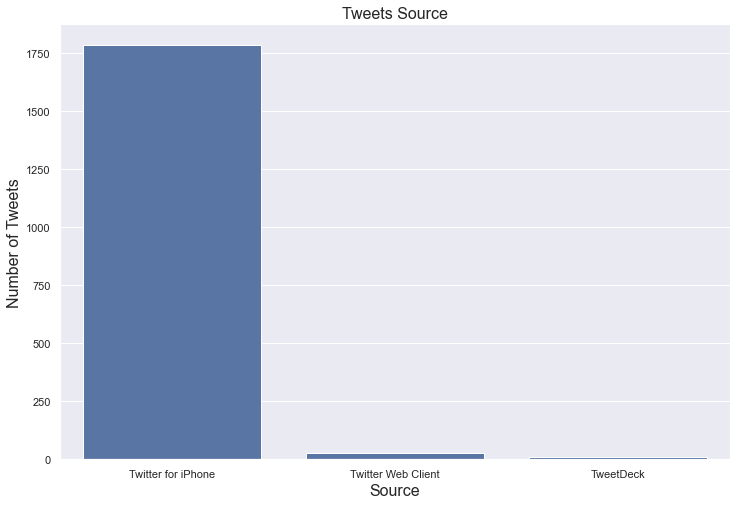

In [67]:
color_base = sns.color_palette()[0]
sns.countplot(data=combined_dataset, x='source', color=color_base)
plt.title('Tweets Source', fontsize = 16)
plt.ylabel('Number of Tweets', fontsize = 16)
plt.xlabel('Source', fontsize = 16);

plt.savefig("tweet_source.png")

Iphone users account for almost all the dog tweets

### What are the top 10 most popular dog breed in the tweets?


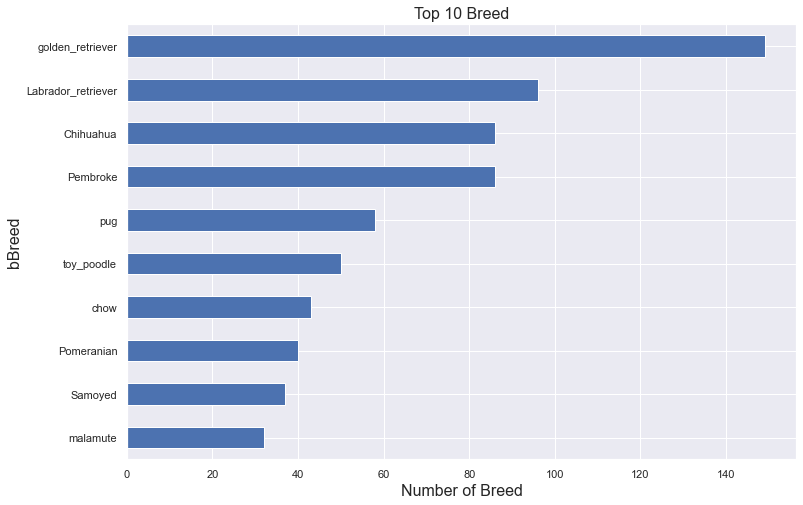

In [68]:
dog_breed = combined_dataset[combined_dataset['breed']!='none']['breed'].value_counts().head(10)

dog_breed.plot(kind='barh')
plt.title('Top 10 Breed', fontsize = 16)
plt.ylabel('bBreed', fontsize = 16)
plt.xlabel('Number of Breed', fontsize = 16)
plt.gca().invert_yaxis();

plt.savefig("top_to_breed.png")

The most common breed among the dogs is Golden Retriever followed by Labrador Retriever and Chihuahua

### Which is the top rated dog based on retweets


In [69]:
top_dog_retweeted = combined_dataset[combined_dataset['retweet_count'] ==combined_dataset['retweet_count'].max()]


In [70]:
top_dog_retweeted['jpg_url']


742    https://pbs.twimg.com/ext_tw_video_thumb/74423...
Name: jpg_url, dtype: object

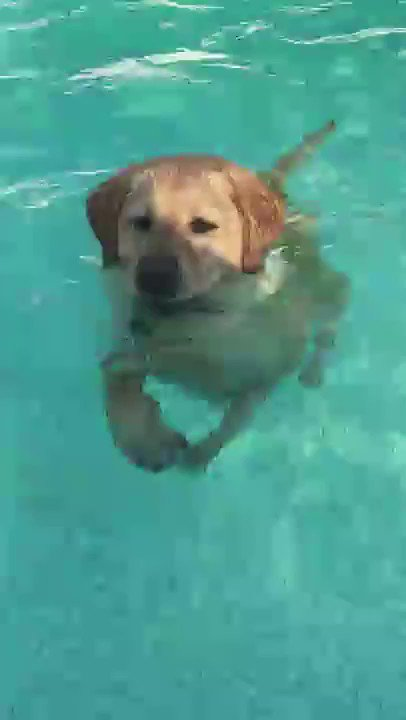

In [71]:
from IPython import display
display.Image('https://pbs.twimg.com/ext_tw_video_thumb/744234667679821824/pu/img/1GaWmtJtdqzZV7jy.jpg')

This is the dog image that with the highest retweets


### Which is the top rated dog based on favorite counts


In [72]:
top_dog_fovorite = combined_dataset[combined_dataset['favorite_count'] ==combined_dataset['favorite_count'].max()]
top_dog_fovorite['jpg_url']

742    https://pbs.twimg.com/ext_tw_video_thumb/74423...
Name: jpg_url, dtype: object

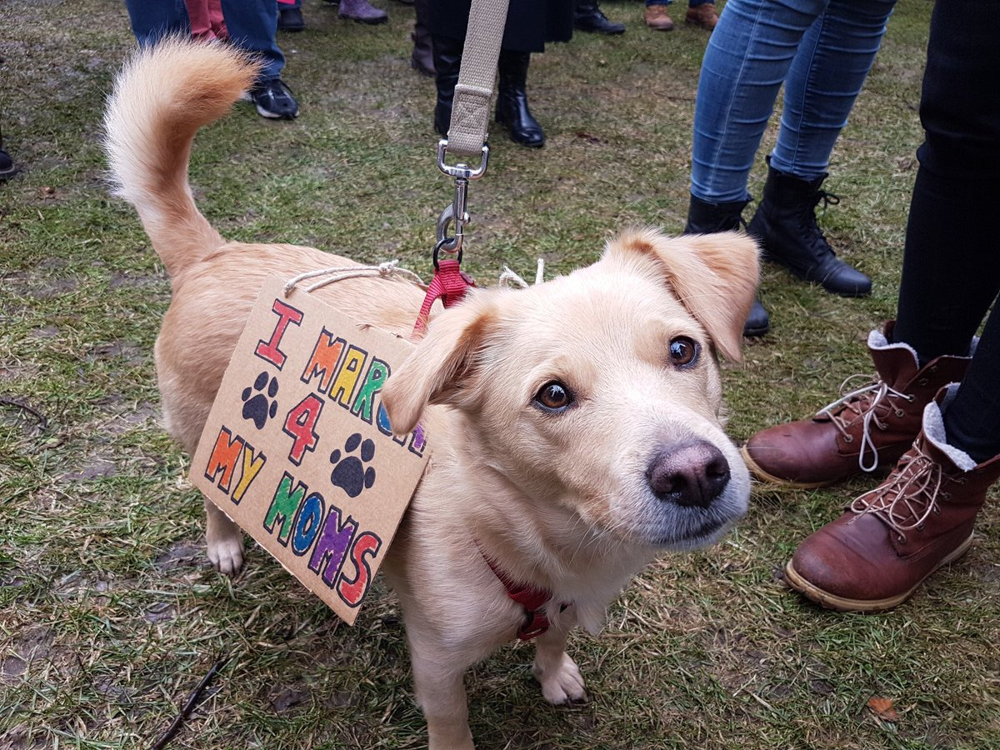

In [73]:
display.Image('https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg')


This is the dog image that with the highest favorite counts


### Which is top rated dog based on rating, retweet count and favorite counts combined?

In [74]:
top_rated_dog = combined_dataset[combined_dataset['rating_numerator'] == 13.0]
top_rated_dog[['retweet_count', 'favorite_count', 'confidence','jpg_url']].sort_values(by=['retweet_count', 'favorite_count'], ascending = False)[:1]

,retweet_count,favorite_count,confidence,jpg_url
742,70742.0,144893.0,0.825333,https://pbs.twimg.com/ext_tw_video_thumb/74423...


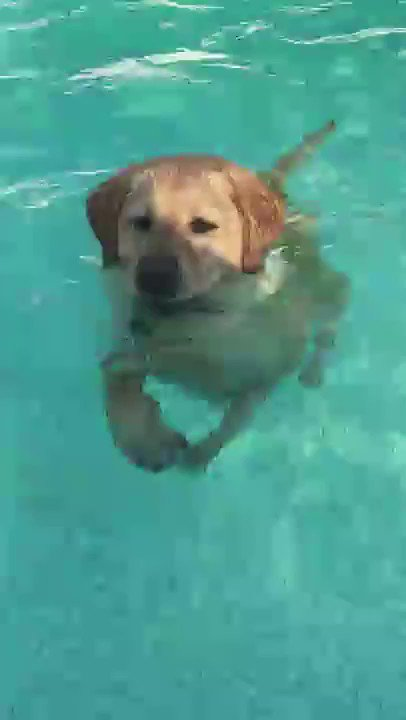

In [75]:
display.Image(top_rated_dog.loc[742].jpg_url)

This is the dog with the highest rating, retweet count and favorite counts. It is our top rated dog from the tweet.